In [1]:
import sys
sys.path.append('..')
sys.path.append("..")
sys.path.append("../dl")

import torch
import segmentation_models_pytorch as smp
from omegaconf import OmegaConf
from torch import nn

from config import conf
from inferer import *
from lightning_model import *

/home/leos/.local/lib/python3.6/site-packages/pandas/compat/_optional.py:106: UserWarning: Pandas requires version '1.2.1' or newer of 'bottleneck' (version '1.2.0' currently installed).
  warnings.warn(msg, UserWarning)
/usr/lib/python3.6/importlib/_bootstrap.py:219: RuntimeWarning:

numpy.ufunc size changed, may indicate binary incompatibility. Expected 192 from C header, got 216 from PyObject

/usr/lib/python3.6/importlib/_bootstrap.py:219: RuntimeWarning:

numpy.ufunc size changed, may indicate binary incompatibility. Expected 192 from C header, got 216 from PyObject

/usr/lib/python3.6/importlib/_bootstrap.py:219: RuntimeWarning:

numpy.ufunc size changed, may indicate binary incompatibility. Expected 192 from C header, got 216 from PyObject

/usr/lib/python3.6/importlib/_bootstrap.py:219: RuntimeWarning:

numpy.ufunc size changed, may indicate binary incompatibility. Expected 216, got 192

/usr/lib/python3.6/importlib/_bootstrap.py:219: ImportWarning:

can't resolve package from 

In [2]:
model = smp.FPN(
    encoder_name="resnext50_32x4d",
    classes=2,
    decoder_merge_policy='cat'
)

PATH = Path(conf['paths']['experiment_root_dir'])
PATH = PATH.joinpath((f"{conf['training_args']['model_name']}/"
                      f"version_{conf['training_args']['experiment_version']}"))
PATH = PATH.joinpath(f"last.ckpt")

segmodel = SegModel.from_conf(model, conf)
checkpoint = torch.load(PATH, map_location = lambda storage, loc : storage)
segmodel.load_state_dict(checkpoint['state_dict'])

<All keys matched successfully>

In [3]:
inf = Inferer.from_conf(segmodel, conf)

In [4]:
infobj = inf.run()

Prediction for: test_0
Prediction for: test_1
Prediction for: test_10
Prediction for: test_100
Prediction for: test_1000
Prediction for: test_1001
Prediction for: test_1002
Prediction for: test_1003
Prediction for: test_1004
Prediction for: test_1005
Prediction for: test_1006
Prediction for: test_1007
Prediction for: test_1008
Prediction for: test_1009
Prediction for: test_101
Prediction for: test_1010
Prediction for: test_1011
Prediction for: test_1012
Prediction for: test_1013
Prediction for: test_1014
Prediction for: test_1015
Prediction for: test_1016
Prediction for: test_1017
Prediction for: test_1018
Prediction for: test_1019
Prediction for: test_102
Prediction for: test_1020
Prediction for: test_1021
Prediction for: test_1022
Prediction for: test_1023
Prediction for: test_1024
Prediction for: test_1025
Prediction for: test_1026
Prediction for: test_1027
Prediction for: test_1028
Prediction for: test_1029
Prediction for: test_103
Prediction for: test_1030
Prediction for: test_103

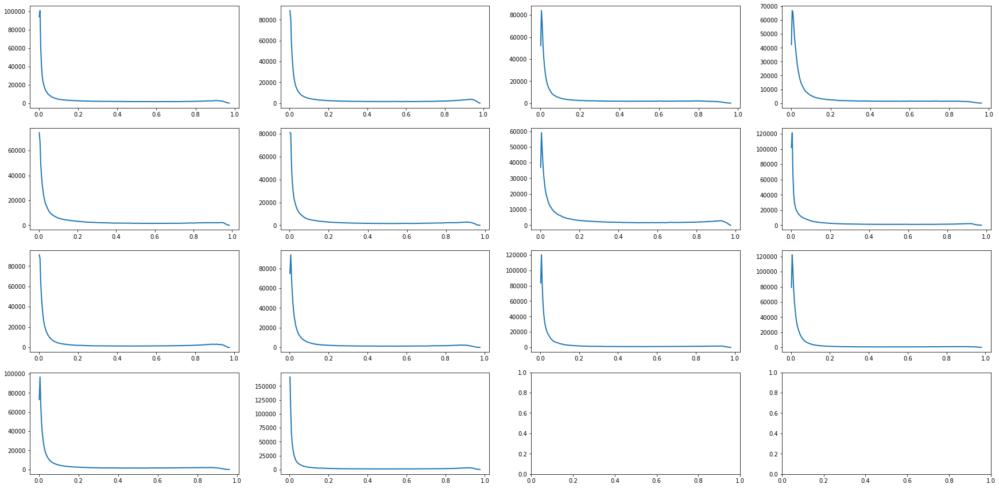

In [5]:
inf.plot_histograms()

In [6]:
# inf.save_outputs('pöö/pö/pöö/image.png')

In [7]:
# inf.plot_predictions()

In [5]:
inf.post_process()

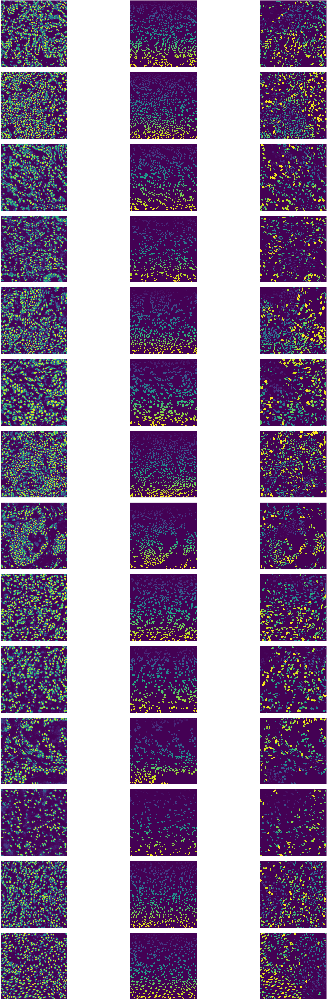

In [9]:
inf.plot_segmentations()

In [6]:
inf.benchmark()

error: 'i' format requires -2147483648 <= number <= 2147483647